Code for **super-resolution** (figures $1$ and $5$ from main paper).. Change `factor` to $8$ to reproduce images from fig. $9$ from supmat.

You can play with parameters and see how they affect the result. 

In [11]:
"""
*Uncomment if running on colab* 
Set Runtime -> Change runtime type -> Under Hardware Accelerator select GPU in Google Colab 
"""
!git clone https://github.com/DmitryUlyanov/deep-image-prior
!mv deep-image-prior/* ./

fatal: destination path 'deep-image-prior' already exists and is not an empty directory.
mv: cannot stat 'deep-image-prior/*': No such file or directory


# Import libs

In [0]:
from __future__ import print_function
import matplotlib.pyplot as plt
%matplotlib inline

import argparse
import os
# os.environ['CUDA_VISIBLE_DEVICES'] = '1'

import numpy as np
from models import *

import torch
import torch.optim

from skimage.measure import compare_psnr
from models.downsampler import Downsampler

from utils.sr_utils import *

torch.backends.cudnn.enabled = True
torch.backends.cudnn.benchmark =True
dtype = torch.cuda.FloatTensor

imsize = -1 
factor = 4 # 8
enforse_div32 = 'CROP' # we usually need the dimensions to be divisible by a power of two (32 in this case)
PLOT = True

# To produce images from the paper we took *_GT.png images from LapSRN viewer for corresponding factor,
# e.g. x4/zebra_GT.png for factor=4, and x8/zebra_GT.png for factor=8 
path_to_image = 'data/sr/zebra_GT.png'

# Load image and baselines

HR and LR resolutions: (576, 384), (144, 96)


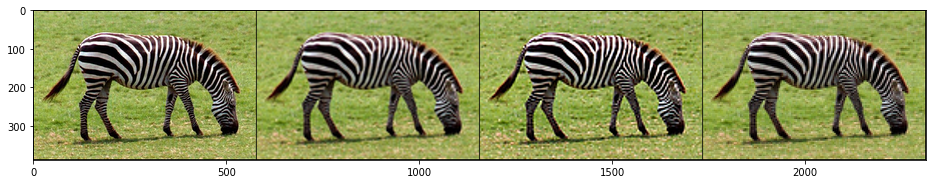

PSNR bicubic: 23.1048   PSNR nearest: 20.8212


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.
  if __name__ == '__main__':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.
  # Remove the CWD from sys.path while we load stuff.


In [13]:
# Starts here
imgs = load_LR_HR_imgs_sr(path_to_image , imsize, factor, enforse_div32)

imgs['bicubic_np'], imgs['sharp_np'], imgs['nearest_np'] = get_baselines(imgs['LR_pil'], imgs['HR_pil'])

if PLOT:
    plot_image_grid([imgs['HR_np'], imgs['bicubic_np'], imgs['sharp_np'], imgs['nearest_np']], 4,12);
    print ('PSNR bicubic: %.4f   PSNR nearest: %.4f' %  (
                                        compare_psnr(imgs['HR_np'], imgs['bicubic_np']), 
                                        compare_psnr(imgs['HR_np'], imgs['nearest_np'])))

# Set up parameters and net

In [0]:
input_depth = 32
 
INPUT =     'noise'
pad   =     'reflection'
OPT_OVER =  'net'
KERNEL_TYPE='lanczos2'

LR = 0.01
tv_weight = 0.0

OPTIMIZER = 'adam'

if factor == 4: 
    num_iter = 2000
    reg_noise_std = 0.03
elif factor == 8:
    num_iter = 4000
    reg_noise_std = 0.05
else:
    assert False, 'We did not experiment with other factors'

In [0]:
net_input = get_noise(input_depth, INPUT, (imgs['HR_pil'].size[1], imgs['HR_pil'].size[0])).type(dtype).detach()

NET_TYPE = 'skip' # UNet, ResNet
net = get_net(input_depth, 'skip', pad,
              skip_n33d=128, 
              skip_n33u=128, 
              skip_n11=4, 
              num_scales=5,
              upsample_mode='bilinear').type(dtype)

# Losses
mse = torch.nn.MSELoss().type(dtype)

img_LR_var = np_to_torch(imgs['LR_np']).type(dtype)

downsampler = Downsampler(n_planes=3, factor=factor, kernel_type=KERNEL_TYPE, phase=0.5, preserve_size=True).type(dtype)

# Define closure and optimize

In [0]:
import numpy as np
x= []
y=[]
def closure():
    global i, net_input,x , y
    
    if reg_noise_std > 0:
        net_input = net_input_saved + (noise.normal_() * reg_noise_std)

    out_HR = net(net_input)
    out_LR = downsampler(out_HR)

    total_loss = mse(out_LR, img_LR_var) 
   
    x= np.append(x,[total_loss])
    y=np.append(y, [i])
    if tv_weight > 0:
        total_loss += tv_weight * tv_loss(out_HR)
        
    total_loss.backward()

    # Log
    psnr_LR = compare_psnr(imgs['LR_np'], torch_to_np(out_LR))
    psnr_HR = compare_psnr(imgs['HR_np'], torch_to_np(out_HR))
    print ('Iteration %05d    PSNR_LR %.3f   PSNR_HR %.3f' % (i, psnr_LR, psnr_HR), sep='\r', end='')
                      
    # History
    psnr_history.append([psnr_LR, psnr_HR])
    
    if PLOT and i % 100 == 0:
        out_HR_np = torch_to_np(out_HR)
        plot_image_grid([imgs['HR_np'], imgs['bicubic_np'], np.clip(out_HR_np, 0, 1)], factor=13, nrow=3)

    i += 1
    
    return total_loss

Starting optimization with ADAM
Iteration 00000    PSNR_LR 27.683   PSNR_HR 22.325

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2973: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:23: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:24: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.


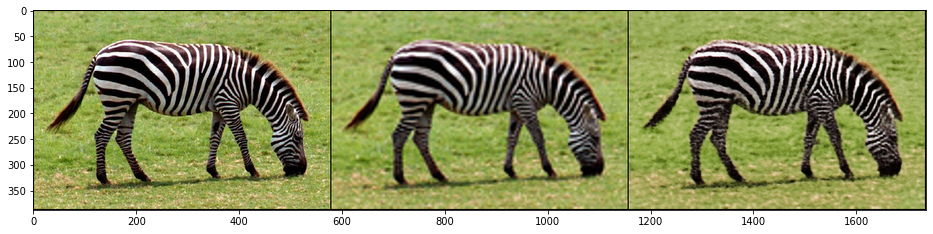

Iteration 00001    PSNR_LR 14.055   PSNR_HR 13.411Iteration 00002    PSNR_LR 15.772   PSNR_HR 14.840Iteration 00003    PSNR_LR 18.120   PSNR_HR 16.867Iteration 00004    PSNR_LR 19.221   PSNR_HR 17.764Iteration 00005    PSNR_LR 19.914   PSNR_HR 18.251Iteration 00006    PSNR_LR 19.942   PSNR_HR 18.239Iteration 00007    PSNR_LR 20.376   PSNR_HR 18.555Iteration 00008    PSNR_LR 21.029   PSNR_HR 19.053Iteration 00009    PSNR_LR 21.401   PSNR_HR 19.313Iteration 00010    PSNR_LR 21.633   PSNR_HR 19.460Iteration 00011    PSNR_LR 22.074   PSNR_HR 19.738Iteration 00012    PSNR_LR 22.133   PSNR_HR 19.724Iteration 00013    PSNR_LR 22.389   PSNR_HR 19.853Iteration 00014    PSNR_LR 22.705   PSNR_HR 20.042Iteration 00015    PSNR_LR 23.075   PSNR_HR 20.290Iteration 00016    PSNR_LR 23.248   PSNR_HR 20.413Iteration 00017    PSNR_LR 23.452   PSNR_HR 20.528Iteration 00018    PSNR_LR 23.675   PSNR_HR 20.598Iteration 00019    PSNR_LR 23.698   PSNR_HR 20.559Iteration 00020    PSNR_LR 23.902   PSNR_HR 20.650

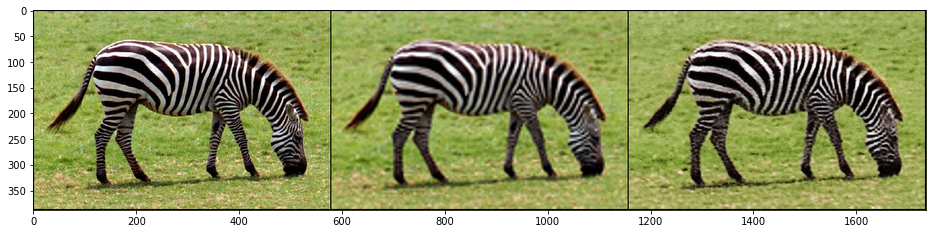

Iteration 00101    PSNR_LR 29.617   PSNR_HR 22.876Iteration 00102    PSNR_LR 29.691   PSNR_HR 22.909Iteration 00103    PSNR_LR 29.832   PSNR_HR 22.913Iteration 00104    PSNR_LR 29.639   PSNR_HR 22.876Iteration 00105    PSNR_LR 29.793   PSNR_HR 22.937Iteration 00106    PSNR_LR 29.806   PSNR_HR 22.929Iteration 00107    PSNR_LR 29.886   PSNR_HR 22.933Iteration 00108    PSNR_LR 29.936   PSNR_HR 22.933Iteration 00109    PSNR_LR 29.954   PSNR_HR 22.946Iteration 00110    PSNR_LR 29.963   PSNR_HR 22.977Iteration 00111    PSNR_LR 29.979   PSNR_HR 22.937Iteration 00112    PSNR_LR 30.015   PSNR_HR 22.980Iteration 00113    PSNR_LR 29.963   PSNR_HR 22.943Iteration 00114    PSNR_LR 29.962   PSNR_HR 22.941Iteration 00115    PSNR_LR 29.998   PSNR_HR 22.962Iteration 00116    PSNR_LR 30.055   PSNR_HR 23.006Iteration 00117    PSNR_LR 30.105   PSNR_HR 22.975Iteration 00118    PSNR_LR 30.078   PSNR_HR 22.985Iteration 00119    PSNR_LR 30.141   PSNR_HR 23.001Iteration 00120    PSNR_LR 30.140   PSNR_HR 23.025

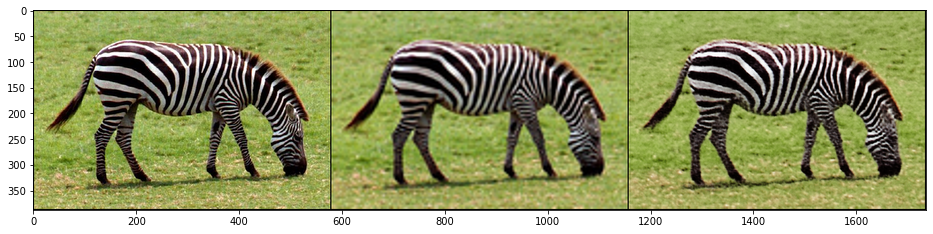

Iteration 00201    PSNR_LR 31.507   PSNR_HR 23.275Iteration 00202    PSNR_LR 31.482   PSNR_HR 23.238Iteration 00203    PSNR_LR 31.564   PSNR_HR 23.322Iteration 00204    PSNR_LR 31.629   PSNR_HR 23.289Iteration 00205    PSNR_LR 31.518   PSNR_HR 23.305Iteration 00206    PSNR_LR 31.589   PSNR_HR 23.343Iteration 00207    PSNR_LR 31.591   PSNR_HR 23.308Iteration 00208    PSNR_LR 31.501   PSNR_HR 23.303Iteration 00209    PSNR_LR 31.559   PSNR_HR 23.327Iteration 00210    PSNR_LR 31.675   PSNR_HR 23.352Iteration 00211    PSNR_LR 31.586   PSNR_HR 23.293Iteration 00212    PSNR_LR 31.654   PSNR_HR 23.308Iteration 00213    PSNR_LR 31.634   PSNR_HR 23.285Iteration 00214    PSNR_LR 31.669   PSNR_HR 23.285Iteration 00215    PSNR_LR 31.697   PSNR_HR 23.293Iteration 00216    PSNR_LR 31.729   PSNR_HR 23.364Iteration 00217    PSNR_LR 31.742   PSNR_HR 23.319Iteration 00218    PSNR_LR 31.655   PSNR_HR 23.304Iteration 00219    PSNR_LR 31.807   PSNR_HR 23.347Iteration 00220    PSNR_LR 31.829   PSNR_HR 23.291

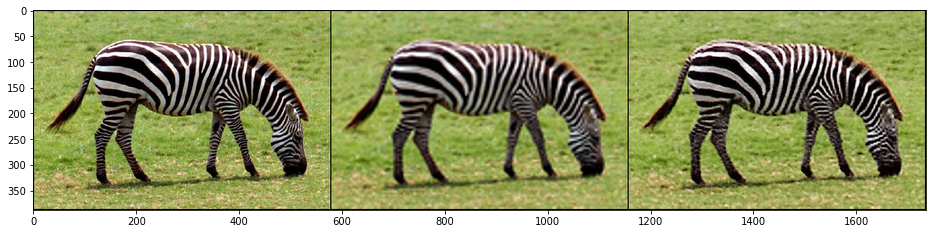

Iteration 00301    PSNR_LR 32.791   PSNR_HR 23.487Iteration 00302    PSNR_LR 32.761   PSNR_HR 23.444Iteration 00303    PSNR_LR 32.735   PSNR_HR 23.440Iteration 00304    PSNR_LR 32.723   PSNR_HR 23.435Iteration 00305    PSNR_LR 32.686   PSNR_HR 23.424Iteration 00306    PSNR_LR 32.709   PSNR_HR 23.399Iteration 00307    PSNR_LR 32.814   PSNR_HR 23.420Iteration 00308    PSNR_LR 32.749   PSNR_HR 23.452Iteration 00309    PSNR_LR 32.716   PSNR_HR 23.459Iteration 00310    PSNR_LR 32.678   PSNR_HR 23.417Iteration 00311    PSNR_LR 32.771   PSNR_HR 23.431Iteration 00312    PSNR_LR 32.816   PSNR_HR 23.474Iteration 00313    PSNR_LR 32.831   PSNR_HR 23.478Iteration 00314    PSNR_LR 32.847   PSNR_HR 23.474Iteration 00315    PSNR_LR 32.731   PSNR_HR 23.468Iteration 00316    PSNR_LR 32.727   PSNR_HR 23.471Iteration 00317    PSNR_LR 32.790   PSNR_HR 23.456Iteration 00318    PSNR_LR 32.789   PSNR_HR 23.467Iteration 00319    PSNR_LR 32.778   PSNR_HR 23.458Iteration 00320    PSNR_LR 32.754   PSNR_HR 23.445

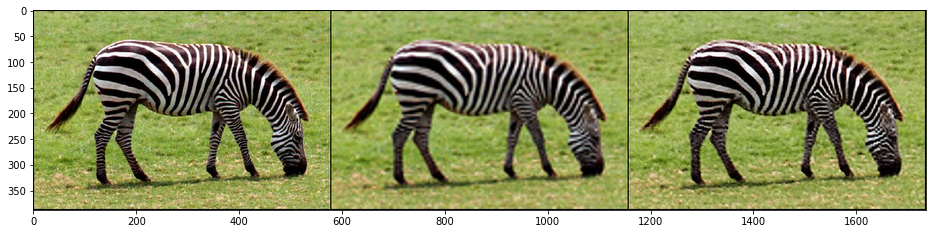

Iteration 00401    PSNR_LR 33.503   PSNR_HR 23.599Iteration 00402    PSNR_LR 33.379   PSNR_HR 23.487Iteration 00403    PSNR_LR 33.614   PSNR_HR 23.557Iteration 00404    PSNR_LR 33.429   PSNR_HR 23.564Iteration 00405    PSNR_LR 33.387   PSNR_HR 23.480Iteration 00406    PSNR_LR 33.651   PSNR_HR 23.561Iteration 00407    PSNR_LR 33.490   PSNR_HR 23.552Iteration 00408    PSNR_LR 33.570   PSNR_HR 23.543Iteration 00409    PSNR_LR 33.745   PSNR_HR 23.524Iteration 00410    PSNR_LR 33.515   PSNR_HR 23.520Iteration 00411    PSNR_LR 33.785   PSNR_HR 23.579Iteration 00412    PSNR_LR 33.528   PSNR_HR 23.532Iteration 00413    PSNR_LR 33.505   PSNR_HR 23.545Iteration 00414    PSNR_LR 33.610   PSNR_HR 23.559Iteration 00415    PSNR_LR 33.533   PSNR_HR 23.532Iteration 00416    PSNR_LR 33.710   PSNR_HR 23.557Iteration 00417    PSNR_LR 33.477   PSNR_HR 23.578Iteration 00418    PSNR_LR 33.573   PSNR_HR 23.538Iteration 00419    PSNR_LR 33.681   PSNR_HR 23.559Iteration 00420    PSNR_LR 33.567   PSNR_HR 23.575

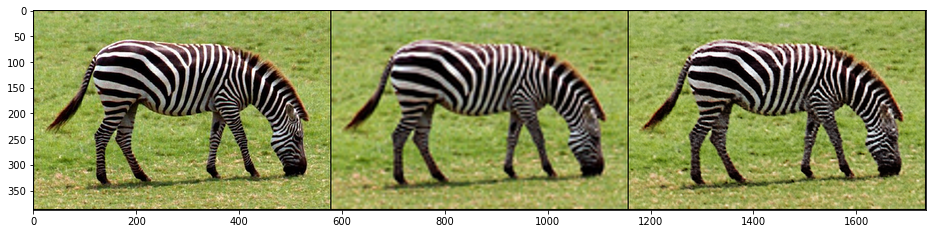

Iteration 00501    PSNR_LR 34.300   PSNR_HR 23.594Iteration 00502    PSNR_LR 34.472   PSNR_HR 23.601Iteration 00503    PSNR_LR 34.489   PSNR_HR 23.647Iteration 00504    PSNR_LR 34.305   PSNR_HR 23.572Iteration 00505    PSNR_LR 34.202   PSNR_HR 23.615Iteration 00506    PSNR_LR 34.324   PSNR_HR 23.619Iteration 00507    PSNR_LR 34.355   PSNR_HR 23.614Iteration 00508    PSNR_LR 34.414   PSNR_HR 23.607Iteration 00509    PSNR_LR 34.385   PSNR_HR 23.575Iteration 00510    PSNR_LR 34.426   PSNR_HR 23.621Iteration 00511    PSNR_LR 34.529   PSNR_HR 23.622Iteration 00512    PSNR_LR 34.387   PSNR_HR 23.619Iteration 00513    PSNR_LR 34.424   PSNR_HR 23.669Iteration 00514    PSNR_LR 34.406   PSNR_HR 23.675Iteration 00515    PSNR_LR 34.203   PSNR_HR 23.606Iteration 00516    PSNR_LR 34.309   PSNR_HR 23.644Iteration 00517    PSNR_LR 34.424   PSNR_HR 23.624Iteration 00518    PSNR_LR 34.496   PSNR_HR 23.598Iteration 00519    PSNR_LR 34.281   PSNR_HR 23.627Iteration 00520    PSNR_LR 34.336   PSNR_HR 23.581

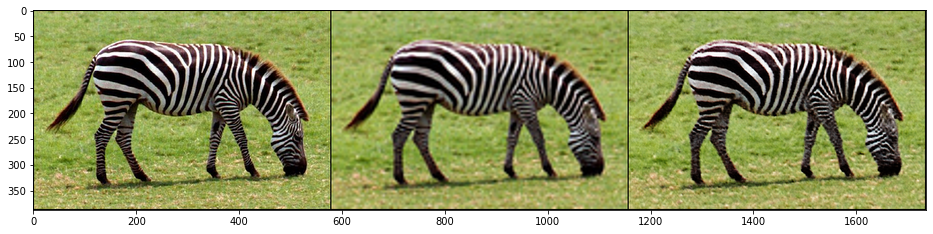

Iteration 00601    PSNR_LR 34.830   PSNR_HR 23.664Iteration 00602    PSNR_LR 35.038   PSNR_HR 23.686Iteration 00603    PSNR_LR 34.711   PSNR_HR 23.696Iteration 00604    PSNR_LR 34.846   PSNR_HR 23.641Iteration 00605    PSNR_LR 34.916   PSNR_HR 23.663Iteration 00606    PSNR_LR 35.078   PSNR_HR 23.716Iteration 00607    PSNR_LR 34.862   PSNR_HR 23.651Iteration 00608    PSNR_LR 35.011   PSNR_HR 23.728Iteration 00609    PSNR_LR 34.983   PSNR_HR 23.704Iteration 00610    PSNR_LR 34.887   PSNR_HR 23.674Iteration 00611    PSNR_LR 35.101   PSNR_HR 23.693Iteration 00612    PSNR_LR 35.041   PSNR_HR 23.707Iteration 00613    PSNR_LR 35.016   PSNR_HR 23.658Iteration 00614    PSNR_LR 35.061   PSNR_HR 23.651Iteration 00615    PSNR_LR 34.898   PSNR_HR 23.680Iteration 00616    PSNR_LR 34.891   PSNR_HR 23.667Iteration 00617    PSNR_LR 35.171   PSNR_HR 23.709Iteration 00618    PSNR_LR 35.091   PSNR_HR 23.677Iteration 00619    PSNR_LR 34.978   PSNR_HR 23.654Iteration 00620    PSNR_LR 35.038   PSNR_HR 23.716

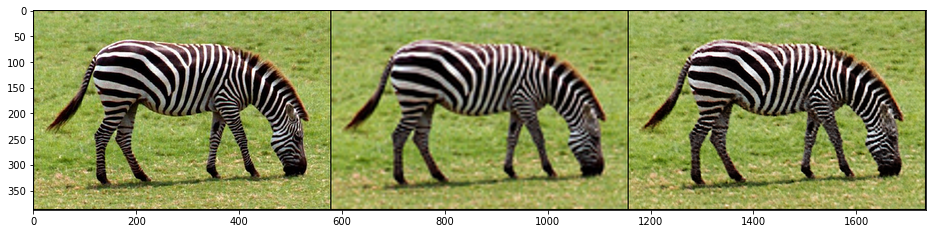

Iteration 00701    PSNR_LR 35.546   PSNR_HR 23.730Iteration 00702    PSNR_LR 35.470   PSNR_HR 23.697Iteration 00703    PSNR_LR 35.553   PSNR_HR 23.721Iteration 00704    PSNR_LR 35.540   PSNR_HR 23.671Iteration 00705    PSNR_LR 35.608   PSNR_HR 23.690Iteration 00706    PSNR_LR 35.508   PSNR_HR 23.738Iteration 00707    PSNR_LR 35.587   PSNR_HR 23.700Iteration 00708    PSNR_LR 35.533   PSNR_HR 23.739Iteration 00709    PSNR_LR 35.679   PSNR_HR 23.685Iteration 00710    PSNR_LR 35.613   PSNR_HR 23.727Iteration 00711    PSNR_LR 35.368   PSNR_HR 23.740Iteration 00712    PSNR_LR 35.452   PSNR_HR 23.687Iteration 00713    PSNR_LR 35.678   PSNR_HR 23.701Iteration 00714    PSNR_LR 35.535   PSNR_HR 23.698Iteration 00715    PSNR_LR 35.563   PSNR_HR 23.672Iteration 00716    PSNR_LR 35.586   PSNR_HR 23.728Iteration 00717    PSNR_LR 35.671   PSNR_HR 23.732Iteration 00718    PSNR_LR 35.496   PSNR_HR 23.687Iteration 00719    PSNR_LR 35.439   PSNR_HR 23.770Iteration 00720    PSNR_LR 35.594   PSNR_HR 23.715

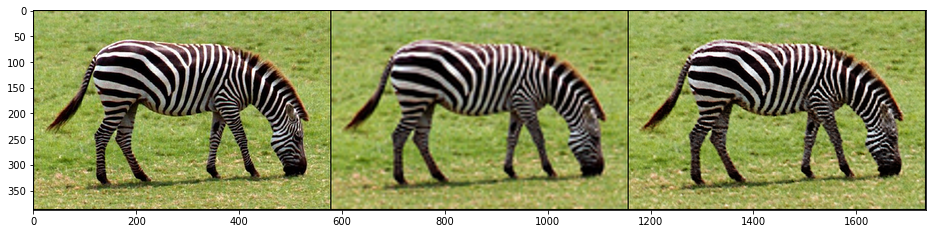

Iteration 00801    PSNR_LR 35.469   PSNR_HR 23.682Iteration 00802    PSNR_LR 36.029   PSNR_HR 23.791Iteration 00803    PSNR_LR 35.736   PSNR_HR 23.789Iteration 00804    PSNR_LR 35.564   PSNR_HR 23.744Iteration 00805    PSNR_LR 35.793   PSNR_HR 23.811Iteration 00806    PSNR_LR 35.905   PSNR_HR 23.765Iteration 00807    PSNR_LR 35.880   PSNR_HR 23.764Iteration 00808    PSNR_LR 35.919   PSNR_HR 23.800Iteration 00809    PSNR_LR 36.027   PSNR_HR 23.763Iteration 00810    PSNR_LR 36.091   PSNR_HR 23.785Iteration 00811    PSNR_LR 35.857   PSNR_HR 23.800Iteration 00812    PSNR_LR 35.821   PSNR_HR 23.777Iteration 00813    PSNR_LR 35.799   PSNR_HR 23.715Iteration 00814    PSNR_LR 35.563   PSNR_HR 23.742Iteration 00815    PSNR_LR 35.941   PSNR_HR 23.770Iteration 00816    PSNR_LR 36.049   PSNR_HR 23.777Iteration 00817    PSNR_LR 36.035   PSNR_HR 23.814Iteration 00818    PSNR_LR 35.982   PSNR_HR 23.740Iteration 00819    PSNR_LR 35.915   PSNR_HR 23.783Iteration 00820    PSNR_LR 36.189   PSNR_HR 23.781

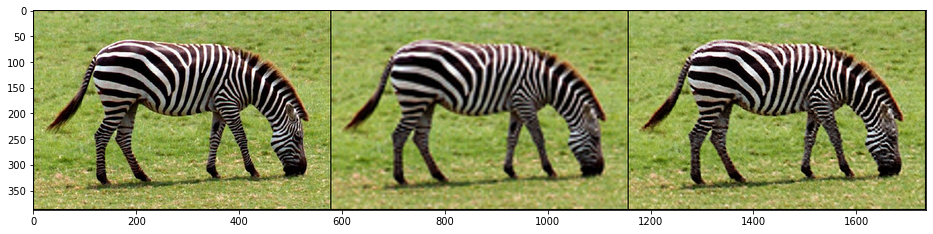

Iteration 00901    PSNR_LR 36.280   PSNR_HR 23.797Iteration 00902    PSNR_LR 36.334   PSNR_HR 23.778Iteration 00903    PSNR_LR 36.424   PSNR_HR 23.779Iteration 00904    PSNR_LR 36.520   PSNR_HR 23.809Iteration 00905    PSNR_LR 36.334   PSNR_HR 23.773Iteration 00906    PSNR_LR 36.436   PSNR_HR 23.793Iteration 00907    PSNR_LR 36.392   PSNR_HR 23.752Iteration 00908    PSNR_LR 36.559   PSNR_HR 23.823Iteration 00909    PSNR_LR 36.358   PSNR_HR 23.825Iteration 00910    PSNR_LR 36.043   PSNR_HR 23.764Iteration 00911    PSNR_LR 36.254   PSNR_HR 23.793Iteration 00912    PSNR_LR 36.500   PSNR_HR 23.795Iteration 00913    PSNR_LR 36.465   PSNR_HR 23.797Iteration 00914    PSNR_LR 36.299   PSNR_HR 23.768Iteration 00915    PSNR_LR 36.467   PSNR_HR 23.772Iteration 00916    PSNR_LR 36.361   PSNR_HR 23.797Iteration 00917    PSNR_LR 36.333   PSNR_HR 23.764Iteration 00918    PSNR_LR 36.259   PSNR_HR 23.804Iteration 00919    PSNR_LR 36.621   PSNR_HR 23.799Iteration 00920    PSNR_LR 36.589   PSNR_HR 23.776

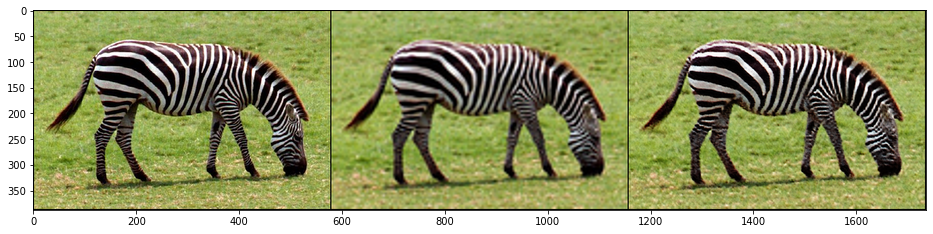

Iteration 01001    PSNR_LR 36.587   PSNR_HR 23.775Iteration 01002    PSNR_LR 36.545   PSNR_HR 23.817Iteration 01003    PSNR_LR 36.533   PSNR_HR 23.780Iteration 01004    PSNR_LR 36.592   PSNR_HR 23.802Iteration 01005    PSNR_LR 36.698   PSNR_HR 23.850Iteration 01006    PSNR_LR 36.643   PSNR_HR 23.825Iteration 01007    PSNR_LR 36.495   PSNR_HR 23.858Iteration 01008    PSNR_LR 36.669   PSNR_HR 23.842Iteration 01009    PSNR_LR 36.370   PSNR_HR 23.821Iteration 01010    PSNR_LR 36.587   PSNR_HR 23.834Iteration 01011    PSNR_LR 36.614   PSNR_HR 23.778Iteration 01012    PSNR_LR 36.660   PSNR_HR 23.811Iteration 01013    PSNR_LR 36.669   PSNR_HR 23.849Iteration 01014    PSNR_LR 36.465   PSNR_HR 23.800Iteration 01015    PSNR_LR 36.591   PSNR_HR 23.817Iteration 01016    PSNR_LR 36.796   PSNR_HR 23.837Iteration 01017    PSNR_LR 36.732   PSNR_HR 23.825Iteration 01018    PSNR_LR 36.730   PSNR_HR 23.860Iteration 01019    PSNR_LR 36.596   PSNR_HR 23.829Iteration 01020    PSNR_LR 36.559   PSNR_HR 23.828

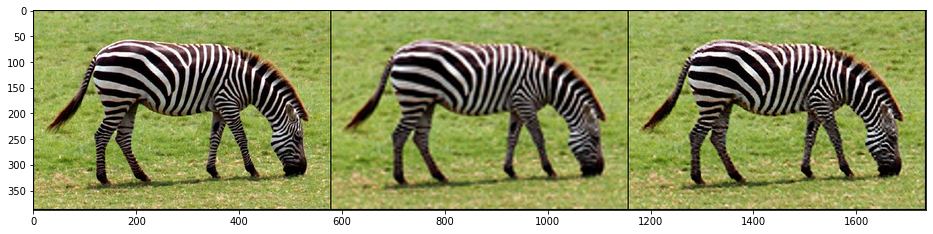

Iteration 01101    PSNR_LR 36.939   PSNR_HR 23.853Iteration 01102    PSNR_LR 37.046   PSNR_HR 23.852Iteration 01103    PSNR_LR 36.961   PSNR_HR 23.817Iteration 01104    PSNR_LR 37.201   PSNR_HR 23.866Iteration 01105    PSNR_LR 37.115   PSNR_HR 23.853Iteration 01106    PSNR_LR 36.842   PSNR_HR 23.820Iteration 01107    PSNR_LR 36.908   PSNR_HR 23.879Iteration 01108    PSNR_LR 36.715   PSNR_HR 23.836Iteration 01109    PSNR_LR 36.821   PSNR_HR 23.848Iteration 01110    PSNR_LR 37.152   PSNR_HR 23.861Iteration 01111    PSNR_LR 36.736   PSNR_HR 23.800Iteration 01112    PSNR_LR 36.700   PSNR_HR 23.864Iteration 01113    PSNR_LR 36.911   PSNR_HR 23.828Iteration 01114    PSNR_LR 37.148   PSNR_HR 23.863Iteration 01115    PSNR_LR 37.024   PSNR_HR 23.902Iteration 01116    PSNR_LR 36.824   PSNR_HR 23.812Iteration 01117    PSNR_LR 36.866   PSNR_HR 23.849Iteration 01118    PSNR_LR 37.062   PSNR_HR 23.853Iteration 01119    PSNR_LR 37.213   PSNR_HR 23.871Iteration 01120    PSNR_LR 37.056   PSNR_HR 23.847

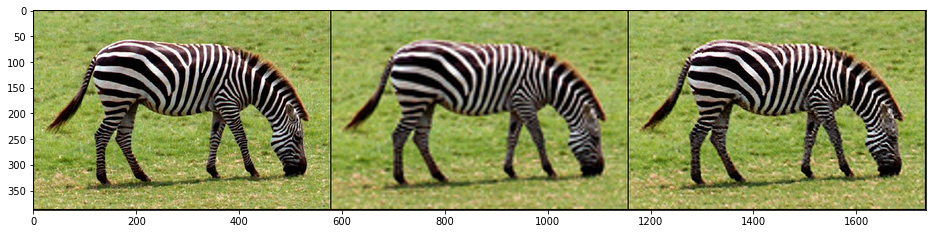

Iteration 01201    PSNR_LR 36.912   PSNR_HR 23.884Iteration 01202    PSNR_LR 36.498   PSNR_HR 23.740Iteration 01203    PSNR_LR 36.371   PSNR_HR 23.857Iteration 01204    PSNR_LR 36.888   PSNR_HR 23.823Iteration 01205    PSNR_LR 37.260   PSNR_HR 23.908Iteration 01206    PSNR_LR 37.301   PSNR_HR 23.904Iteration 01207    PSNR_LR 36.951   PSNR_HR 23.806Iteration 01208    PSNR_LR 36.677   PSNR_HR 23.856Iteration 01209    PSNR_LR 37.356   PSNR_HR 23.840Iteration 01210    PSNR_LR 37.290   PSNR_HR 23.872Iteration 01211    PSNR_LR 36.937   PSNR_HR 23.906Iteration 01212    PSNR_LR 36.905   PSNR_HR 23.851Iteration 01213    PSNR_LR 37.230   PSNR_HR 23.919Iteration 01214    PSNR_LR 37.021   PSNR_HR 23.874Iteration 01215    PSNR_LR 36.989   PSNR_HR 23.833Iteration 01216    PSNR_LR 37.138   PSNR_HR 23.911Iteration 01217    PSNR_LR 37.065   PSNR_HR 23.872Iteration 01218    PSNR_LR 37.240   PSNR_HR 23.862Iteration 01219    PSNR_LR 37.216   PSNR_HR 23.898Iteration 01220    PSNR_LR 37.175   PSNR_HR 23.859

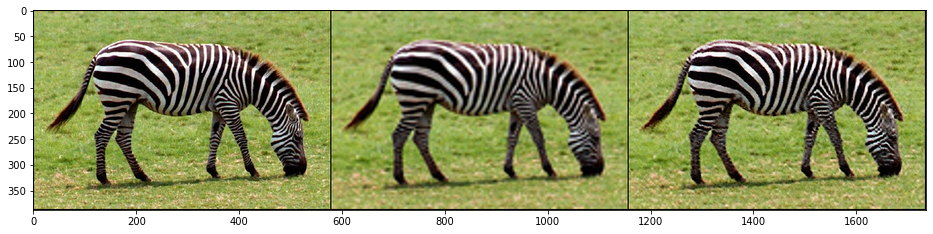

Iteration 01301    PSNR_LR 37.729   PSNR_HR 23.904Iteration 01302    PSNR_LR 37.772   PSNR_HR 23.937Iteration 01303    PSNR_LR 37.704   PSNR_HR 23.897Iteration 01304    PSNR_LR 37.713   PSNR_HR 23.893Iteration 01305    PSNR_LR 37.839   PSNR_HR 23.896Iteration 01306    PSNR_LR 37.763   PSNR_HR 23.909Iteration 01307    PSNR_LR 37.716   PSNR_HR 23.874Iteration 01308    PSNR_LR 37.614   PSNR_HR 23.849Iteration 01309    PSNR_LR 37.798   PSNR_HR 23.889Iteration 01310    PSNR_LR 37.747   PSNR_HR 23.872Iteration 01311    PSNR_LR 37.666   PSNR_HR 23.918Iteration 01312    PSNR_LR 37.687   PSNR_HR 23.884Iteration 01313    PSNR_LR 37.592   PSNR_HR 23.842Iteration 01314    PSNR_LR 37.401   PSNR_HR 23.864Iteration 01315    PSNR_LR 37.541   PSNR_HR 23.847Iteration 01316    PSNR_LR 37.693   PSNR_HR 23.874Iteration 01317    PSNR_LR 37.719   PSNR_HR 23.919Iteration 01318    PSNR_LR 37.665   PSNR_HR 23.881Iteration 01319    PSNR_LR 37.443   PSNR_HR 23.911Iteration 01320    PSNR_LR 37.587   PSNR_HR 23.872

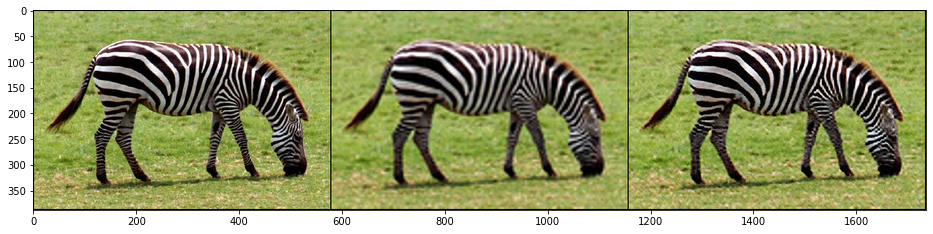

Iteration 01401    PSNR_LR 37.894   PSNR_HR 23.941Iteration 01402    PSNR_LR 37.823   PSNR_HR 23.873Iteration 01403    PSNR_LR 37.841   PSNR_HR 23.876Iteration 01404    PSNR_LR 38.042   PSNR_HR 23.887Iteration 01405    PSNR_LR 37.919   PSNR_HR 23.909Iteration 01406    PSNR_LR 37.891   PSNR_HR 23.955Iteration 01407    PSNR_LR 37.959   PSNR_HR 23.931Iteration 01408    PSNR_LR 38.021   PSNR_HR 23.906Iteration 01409    PSNR_LR 37.776   PSNR_HR 23.898Iteration 01410    PSNR_LR 37.632   PSNR_HR 23.829Iteration 01411    PSNR_LR 37.783   PSNR_HR 23.885Iteration 01412    PSNR_LR 37.939   PSNR_HR 23.880Iteration 01413    PSNR_LR 37.925   PSNR_HR 23.877Iteration 01414    PSNR_LR 38.013   PSNR_HR 23.909Iteration 01415    PSNR_LR 37.814   PSNR_HR 23.905Iteration 01416    PSNR_LR 37.561   PSNR_HR 23.939Iteration 01417    PSNR_LR 37.510   PSNR_HR 23.880Iteration 01418    PSNR_LR 37.476   PSNR_HR 23.924Iteration 01419    PSNR_LR 37.513   PSNR_HR 23.841Iteration 01420    PSNR_LR 37.562   PSNR_HR 23.889

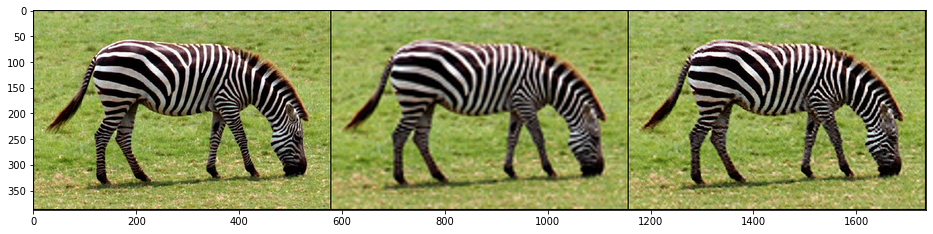

Iteration 01501    PSNR_LR 37.957   PSNR_HR 23.926Iteration 01502    PSNR_LR 37.982   PSNR_HR 23.927Iteration 01503    PSNR_LR 38.139   PSNR_HR 23.944Iteration 01504    PSNR_LR 38.052   PSNR_HR 23.911Iteration 01505    PSNR_LR 37.946   PSNR_HR 23.939Iteration 01506    PSNR_LR 37.934   PSNR_HR 23.921Iteration 01507    PSNR_LR 38.052   PSNR_HR 23.951Iteration 01508    PSNR_LR 38.014   PSNR_HR 23.935Iteration 01509    PSNR_LR 38.241   PSNR_HR 23.975Iteration 01510    PSNR_LR 38.304   PSNR_HR 23.954Iteration 01511    PSNR_LR 38.214   PSNR_HR 23.938Iteration 01512    PSNR_LR 38.205   PSNR_HR 23.963Iteration 01513    PSNR_LR 38.186   PSNR_HR 23.911Iteration 01514    PSNR_LR 38.136   PSNR_HR 23.978Iteration 01515    PSNR_LR 38.157   PSNR_HR 23.923Iteration 01516    PSNR_LR 38.263   PSNR_HR 23.966Iteration 01517    PSNR_LR 38.337   PSNR_HR 23.937Iteration 01518    PSNR_LR 38.205   PSNR_HR 23.929Iteration 01519    PSNR_LR 37.977   PSNR_HR 23.934Iteration 01520    PSNR_LR 37.882   PSNR_HR 23.879

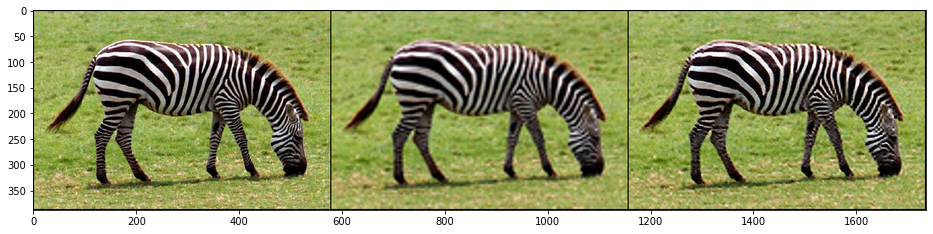

Iteration 01601    PSNR_LR 38.298   PSNR_HR 23.944Iteration 01602    PSNR_LR 38.279   PSNR_HR 23.972Iteration 01603    PSNR_LR 38.197   PSNR_HR 23.946Iteration 01604    PSNR_LR 38.332   PSNR_HR 23.960Iteration 01605    PSNR_LR 38.642   PSNR_HR 23.954Iteration 01606    PSNR_LR 38.373   PSNR_HR 23.950Iteration 01607    PSNR_LR 38.397   PSNR_HR 23.978Iteration 01608    PSNR_LR 38.231   PSNR_HR 23.904Iteration 01609    PSNR_LR 38.409   PSNR_HR 23.918Iteration 01610    PSNR_LR 38.443   PSNR_HR 23.915Iteration 01611    PSNR_LR 38.503   PSNR_HR 23.949Iteration 01612    PSNR_LR 38.591   PSNR_HR 23.971Iteration 01613    PSNR_LR 38.512   PSNR_HR 23.960Iteration 01614    PSNR_LR 38.401   PSNR_HR 23.940Iteration 01615    PSNR_LR 38.446   PSNR_HR 23.942Iteration 01616    PSNR_LR 38.385   PSNR_HR 23.935Iteration 01617    PSNR_LR 38.286   PSNR_HR 23.927Iteration 01618    PSNR_LR 38.279   PSNR_HR 23.959Iteration 01619    PSNR_LR 38.206   PSNR_HR 23.928Iteration 01620    PSNR_LR 38.247   PSNR_HR 23.957

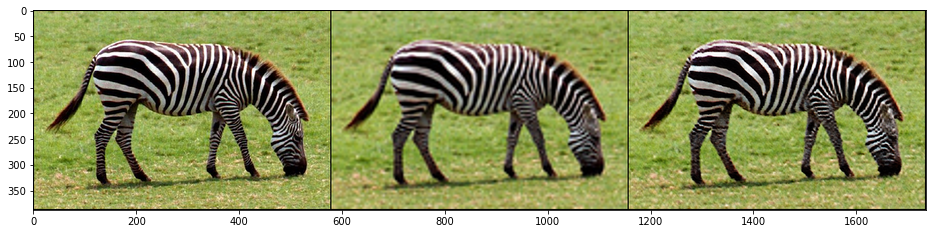

Iteration 01701    PSNR_LR 38.438   PSNR_HR 23.998Iteration 01702    PSNR_LR 38.234   PSNR_HR 23.949Iteration 01703    PSNR_LR 38.736   PSNR_HR 23.966Iteration 01704    PSNR_LR 38.407   PSNR_HR 24.009Iteration 01705    PSNR_LR 38.284   PSNR_HR 23.928Iteration 01706    PSNR_LR 38.336   PSNR_HR 24.014Iteration 01707    PSNR_LR 38.615   PSNR_HR 23.962Iteration 01708    PSNR_LR 38.681   PSNR_HR 23.990Iteration 01709    PSNR_LR 38.629   PSNR_HR 23.971Iteration 01710    PSNR_LR 38.532   PSNR_HR 23.984Iteration 01711    PSNR_LR 38.107   PSNR_HR 23.976Iteration 01712    PSNR_LR 38.387   PSNR_HR 23.956Iteration 01713    PSNR_LR 38.392   PSNR_HR 23.989Iteration 01714    PSNR_LR 38.591   PSNR_HR 23.961Iteration 01715    PSNR_LR 38.625   PSNR_HR 23.968Iteration 01716    PSNR_LR 38.784   PSNR_HR 23.982Iteration 01717    PSNR_LR 38.675   PSNR_HR 23.988Iteration 01718    PSNR_LR 38.549   PSNR_HR 23.966Iteration 01719    PSNR_LR 38.663   PSNR_HR 23.981Iteration 01720    PSNR_LR 38.525   PSNR_HR 23.992

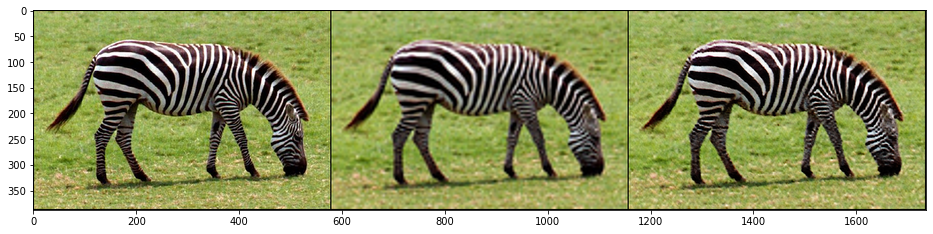

Iteration 01801    PSNR_LR 38.585   PSNR_HR 23.980Iteration 01802    PSNR_LR 38.748   PSNR_HR 23.991Iteration 01803    PSNR_LR 38.779   PSNR_HR 23.972Iteration 01804    PSNR_LR 38.635   PSNR_HR 23.962Iteration 01805    PSNR_LR 38.522   PSNR_HR 23.975Iteration 01806    PSNR_LR 38.430   PSNR_HR 23.953Iteration 01807    PSNR_LR 38.327   PSNR_HR 24.002Iteration 01808    PSNR_LR 38.464   PSNR_HR 23.960Iteration 01809    PSNR_LR 38.803   PSNR_HR 23.986Iteration 01810    PSNR_LR 38.948   PSNR_HR 23.990Iteration 01811    PSNR_LR 38.643   PSNR_HR 23.963Iteration 01812    PSNR_LR 38.496   PSNR_HR 24.023Iteration 01813    PSNR_LR 38.652   PSNR_HR 23.972Iteration 01814    PSNR_LR 38.734   PSNR_HR 24.026Iteration 01815    PSNR_LR 38.725   PSNR_HR 24.014Iteration 01816    PSNR_LR 38.593   PSNR_HR 23.934Iteration 01817    PSNR_LR 38.632   PSNR_HR 24.005Iteration 01818    PSNR_LR 38.800   PSNR_HR 23.990Iteration 01819    PSNR_LR 38.506   PSNR_HR 23.965Iteration 01820    PSNR_LR 38.377   PSNR_HR 23.996

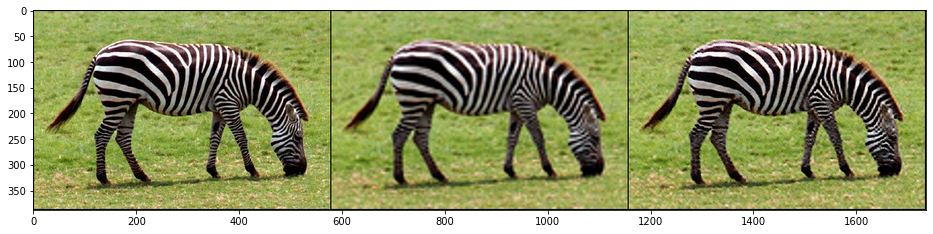

Iteration 01901    PSNR_LR 39.022   PSNR_HR 23.989Iteration 01902    PSNR_LR 38.982   PSNR_HR 23.962Iteration 01903    PSNR_LR 39.007   PSNR_HR 23.962Iteration 01904    PSNR_LR 38.943   PSNR_HR 24.003Iteration 01905    PSNR_LR 38.964   PSNR_HR 23.991Iteration 01906    PSNR_LR 39.027   PSNR_HR 23.981Iteration 01907    PSNR_LR 39.052   PSNR_HR 24.000Iteration 01908    PSNR_LR 38.921   PSNR_HR 23.979Iteration 01909    PSNR_LR 39.028   PSNR_HR 23.983Iteration 01910    PSNR_LR 38.723   PSNR_HR 23.978Iteration 01911    PSNR_LR 38.854   PSNR_HR 24.004Iteration 01912    PSNR_LR 38.993   PSNR_HR 23.964Iteration 01913    PSNR_LR 38.705   PSNR_HR 23.983Iteration 01914    PSNR_LR 38.967   PSNR_HR 23.999Iteration 01915    PSNR_LR 38.904   PSNR_HR 23.980Iteration 01916    PSNR_LR 38.772   PSNR_HR 23.997Iteration 01917    PSNR_LR 38.976   PSNR_HR 24.023Iteration 01918    PSNR_LR 38.898   PSNR_HR 23.997Iteration 01919    PSNR_LR 38.747   PSNR_HR 23.956Iteration 01920    PSNR_LR 39.016   PSNR_HR 24.007

In [24]:
psnr_history = [] 
net_input_saved = net_input.detach().clone()
noise = net_input.detach().clone()

i = 0
p = get_params(OPT_OVER, net, net_input)
optimize(OPTIMIZER, p, closure, LR, num_iter)

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2973: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))


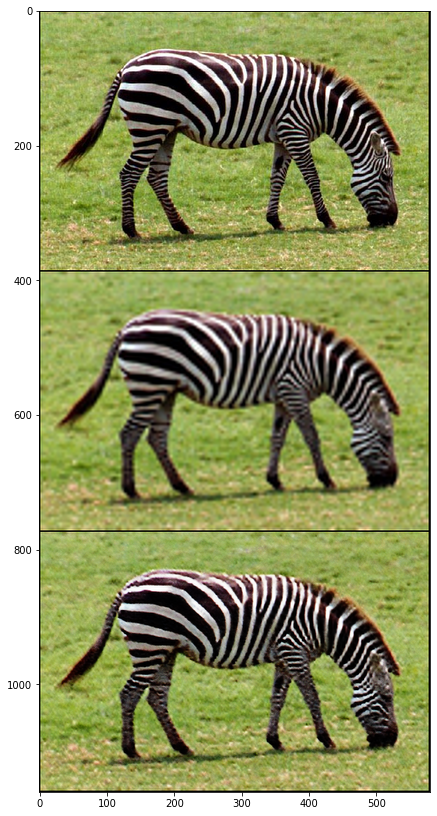

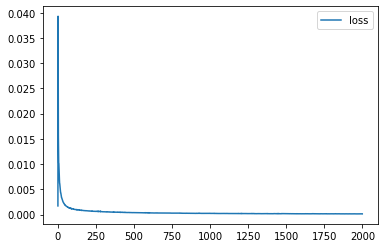

In [29]:
out_HR_np = np.clip(torch_to_np(net(net_input)), 0, 1)
result_deep_prior = put_in_center(out_HR_np, imgs['orig_np'].shape[1:])

# For the paper we acually took `_bicubic.png` files from LapSRN viewer and used `result_deep_prior` as our result
plot_image_grid([imgs['HR_np'],
                 imgs['bicubic_np'],
                 out_HR_np], factor=4, nrow=1);
plt.plot(y,x,label="loss")
plt.legend()
plt.show()
